In [1]:
import torch
import torch.nn.functional as F
from torch import nn
import pandas as pd
import matplotlib.pyplot as plt # for making figures
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import os
import re
from sklearn.manifold import TSNE

In [2]:
display(torch.__version__)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
display(device)

dataset_dir = os.path.join(os.path.curdir, 'datasets')

'2.5.0+cu124'

device(type='cuda')

In [3]:
def clean_text(dir: str):
    with open(os.path.join(dataset_dir, dir), encoding='utf-8') as file: # fixes encoding issue
        text = file.read()

    text = re.sub(r'[^a-zA-Z0-9 \.]', ' ', text) # only consider a-z, A-Z, 0-9, space and period *remember to change for C++*
    text = text.lower() # lowercase
    text = " ".join(text.split()) # merge multiple spaces
    return text

In [4]:
def unique_words(text: str):
    words = pd.Series(text.split())
    words = words[((words.str.len() > 1) & (words.str.len() < 20))]
    words = words[words.str.isalpha()]
    words = words.drop_duplicates(ignore_index=True)
    words = words.sort_values(key=lambda x: x.str.len()).reset_index(drop=True)
    # display(words)
    vocab = words.sort_values().to_list()
    # display(vocab)
    stoi = {s: i + 1 for i, s in enumerate(vocab)}
    stoi['.'] = 0 # map '.' to 0
    itos = {i: s for s, i in stoi.items()} # inverse mapping
    # display(stoi, itos)
    return vocab, stoi, itos

In [5]:
def prepare_data(text: str, block_size: int, stoi):
    words = text.split()
    X, Y = [], []
    for i in range(block_size, len(words)):
        context = words[i-block_size:i]
        target = words[i]
        print(context, target)
        context_ix = [stoi.get(word, stoi['.']) for word in context]
        target_ix = stoi.get(target, stoi['.']) # fix fail for "whatsoever."-like words since we remove words with non-alphanumeric characters
        X.append(context_ix)
        Y.append(target_ix)
    X = torch.tensor(X).to(device)
    Y = torch.tensor(Y).to(device)
    display(X, Y)
    return X, Y

In [6]:
text = clean_text('sherlock.txt')
vocab, stoi, itos = unique_words(text)
X, Y = prepare_data(text, 5, stoi)

['the', 'project', 'gutenberg', 'ebook', 'of'] the
['project', 'gutenberg', 'ebook', 'of', 'the'] adventures
['gutenberg', 'ebook', 'of', 'the', 'adventures'] of
['ebook', 'of', 'the', 'adventures', 'of'] sherlock
['of', 'the', 'adventures', 'of', 'sherlock'] holmes
['the', 'adventures', 'of', 'sherlock', 'holmes'] by
['adventures', 'of', 'sherlock', 'holmes', 'by'] arthur
['of', 'sherlock', 'holmes', 'by', 'arthur'] conan
['sherlock', 'holmes', 'by', 'arthur', 'conan'] doyle
['holmes', 'by', 'arthur', 'conan', 'doyle'] this
['by', 'arthur', 'conan', 'doyle', 'this'] ebook
['arthur', 'conan', 'doyle', 'this', 'ebook'] is
['conan', 'doyle', 'this', 'ebook', 'is'] for
['doyle', 'this', 'ebook', 'is', 'for'] the
['this', 'ebook', 'is', 'for', 'the'] use
['ebook', 'is', 'for', 'the', 'use'] of
['is', 'for', 'the', 'use', 'of'] anyone
['for', 'the', 'use', 'of', 'anyone'] anywhere
['the', 'use', 'of', 'anyone', 'anywhere'] in
['use', 'of', 'anyone', 'anywhere', 'in'] the
['of', 'anyone', 'a

tensor([[6726, 5147, 3090, 2133, 4552],
        [5147, 3090, 2133, 4552, 6726],
        [3090, 2133, 4552, 6726,  124],
        ...,
        [4633, 2194, 4436, 6834, 3188],
        [2194, 4436, 6834, 3188,   15],
        [4436, 6834, 3188,   15, 4430]], device='cuda:0')

tensor([6726,  124, 4552,  ...,   15, 4430,    0], device='cuda:0')

In [7]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([109066, 5]), torch.int64, torch.Size([109066]), torch.int64)

Parameter containing:
tensor([[-1.5432,  0.1516, -0.3224,  ...,  2.1088,  0.3056, -2.0245],
        [ 0.2466,  0.1803, -0.6940,  ..., -0.3178,  0.4594,  0.3817],
        [-0.9016, -1.8186,  0.0575,  ...,  0.1675, -0.9426,  0.1050],
        ...,
        [-0.7199, -0.0327,  1.0442,  ..., -0.8176,  0.2046,  0.2963],
        [ 1.0205, -2.1981,  0.2912,  ..., -1.3839, -0.2294,  0.1156],
        [ 0.3586,  1.3976,  0.2588,  ...,  0.2247, -0.5360,  0.2076]],
       requires_grad=True)

torch.Size([7606, 64])

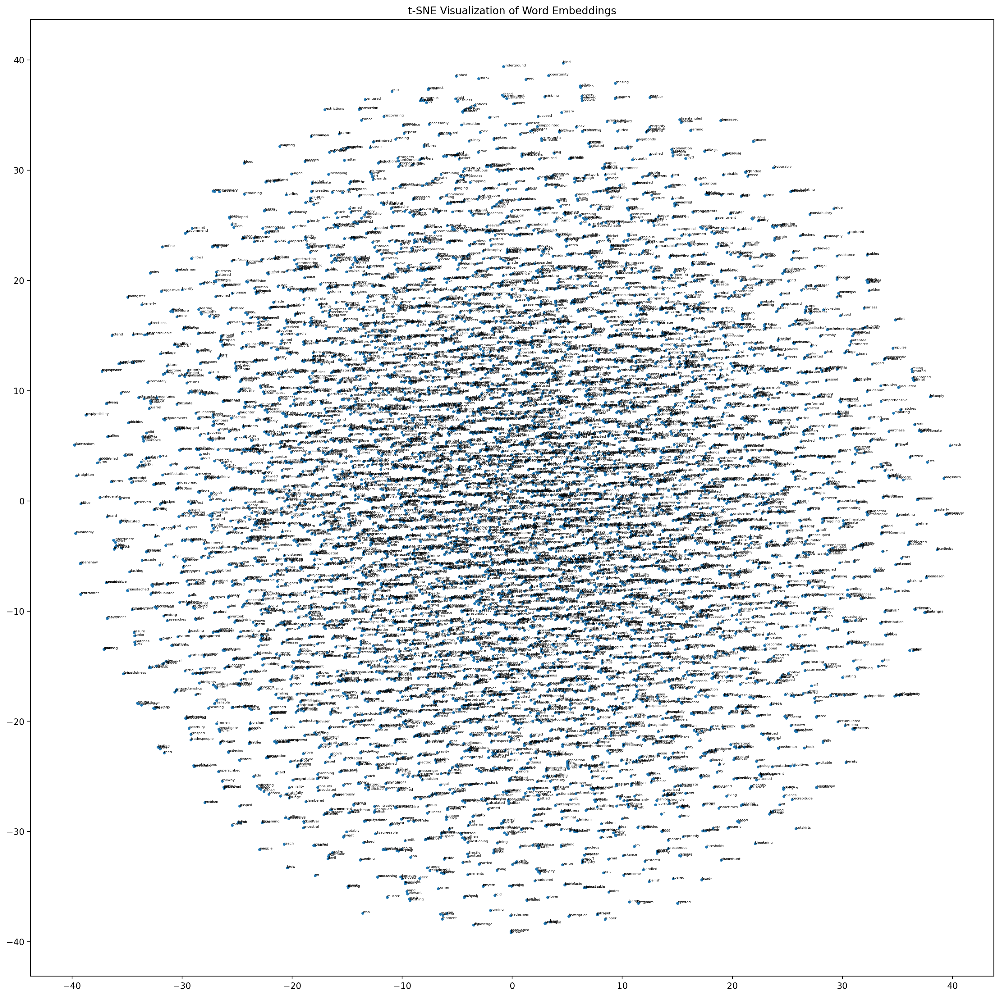

In [8]:
embedding_dim = 64
hidden_dim = 128
block_size = 5
batch_size = 64
epochs = 50
learning_rate = 0.001

embedding = torch.nn.Embedding(len(stoi), embedding_dim)
display(embedding.weight, embedding.weight.shape)
embeddings = embedding.weight.detach().cpu().numpy()

tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

plt.figure(figsize=(20, 20))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=5)

for i, word in enumerate(stoi.keys()):
    plt.annotate(word, (embeddings_2d[i, 0], embeddings_2d[i, 1]), fontsize=4)

plt.title('t-SNE Visualization of Word Embeddings')
plt.show()


In [9]:
class NextWord(nn.Module):
    def __init__(self, block_size, vocab_size, embedding_dim, hidden_dim):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)  # embedding layer
        self.lin1 = nn.Linear(embedding_dim * block_size, hidden_dim)  # first hidden layer
        self.relu = nn.ReLU()  # activation function
        self.lin2 = nn.Linear(hidden_dim, vocab_size)  # output layer

    def forward(self, x):
        embeds = self.embedding(x)
        embeds = embeds.view(x.shape[0], -1)  # flattening embedding outputs
        out = self.lin1(embeds)  # fully connected layer
        out = self.relu(out)  # relu activation
        out = self.lin2(out)  # output
        return out
    
model = NextWord(block_size, len(stoi), embedding_dim, 1 << 10).to(device)

g = torch.Generator()
g.manual_seed(4000002)

# generate without learning
def generate_sequence(model, itos, stoi, block_size, max_len=10):
    context = [0] * block_size
    sequence = []
    for _ in range(max_len):
        x = torch.tensor(context).view(1, -1).to(device)
        y_pred = model(x)        
        ix = torch.distributions.categorical.Categorical(logits=y_pred).sample().item()        
        word = itos[ix]
        if word == '.':
            break        
        sequence.append(word)        
        context = context[1:] + [ix]    
    return ' '.join(sequence)

for i in range(10):
    print(generate_sequence(model, itos, stoi, block_size))


attended quarters fresh asserted credit exists registered revolver length trampled
leaves keyhole penal data regain desperation lawyer cannot saucer animal
repay worrying across servants detour silk novel excuse begging chapter
seedy californian robbery conducting affairs outdoor management contained gong stuffed
angry nova hum gathering half points proposed jezail inquiries obedience
persuasions crusted attentions personal fain strike occurrence chuckled depressing lit
fulfilment goose lee hydraulic arranged desires sorely plantagenet perplexed ordnance
admiring arat liable favour bee gipsies burning rueful fordham gem
portsdown city favoured begged firm provinces each doubted ones chamois
candidate initials honourable sweet piston pillow basis violence awake pictured


In [10]:
for param_name, param in model.named_parameters():
    print(param_name, param.shape)

embedding.weight torch.Size([7606, 64])
lin1.weight torch.Size([1024, 320])
lin1.bias torch.Size([1024])
lin2.weight torch.Size([7606, 1024])
lin2.bias torch.Size([7606])


In [11]:
loss_fn = nn.CrossEntropyLoss()
opt = torch.optim.AdamW(model.parameters(), lr=0.001)

batch_size = 4096
print_every = 50

model.to(device)
X = X.to(device)
Y = Y.to(device)

for epoch in range(1000):
    for i in range(0, X.shape[0], batch_size):
        x = X[i:i+batch_size]
        y = Y[i:i+batch_size]
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        opt.step()
        opt.zero_grad()
    if epoch % print_every == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

Epoch 0, Loss: 7.5136
Epoch 50, Loss: 0.1834
Epoch 100, Loss: 0.1274
Epoch 150, Loss: 0.1360
Epoch 200, Loss: 0.1622
Epoch 250, Loss: 0.1463
Epoch 300, Loss: 0.1203
Epoch 350, Loss: 0.0961
Epoch 400, Loss: 0.0842
Epoch 450, Loss: 0.0786
Epoch 500, Loss: 0.0769
Epoch 550, Loss: 0.0643
Epoch 600, Loss: 0.0591
Epoch 650, Loss: 0.0562
Epoch 700, Loss: 0.0564
Epoch 750, Loss: 0.0555
Epoch 800, Loss: 0.0524
Epoch 850, Loss: 0.0482
Epoch 900, Loss: 0.0507
Epoch 950, Loss: 0.0503


In [19]:
def generate_sequence(model, itos, stoi, context_words, block_size, k=5):
    context = [stoi.get(word, stoi['.']) for word in context_words]
    if len(context) < block_size:
        context = [0] * (block_size - len(context)) + context
    sequence = context_words[:]
    for _ in range(k):
        x = torch.tensor(context[-block_size:]).view(1, -1).to(device)
        y_pred = model(x)
        ix = torch.distributions.categorical.Categorical(logits=y_pred).sample().item()
        word = itos[ix]
        if word == '.':
            break
        sequence.append(word)
        context.append(ix)
    return ' '.join(sequence)

In [20]:
context_words = "and every precaution has to be taken"
generated_sequence = generate_sequence(model, itos, stoi, context_words.split(), block_size=5, k=5)

print(f"Context: {context_words}")
print(f"Generated sequence: {generated_sequence}")

Context: and every precaution has to be taken
Generated sequence: and every precaution has to be taken to quench what might grow
